# 3DMark Firestrike Regression Modeling

In [256]:
import matplotlib.pyplot as plt
import scipy.stats as stats
import seaborn as sns
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler
from sklearn.compose import TransformedTargetRegressor
from yellowbrick.regressor import ResidualsPlot
from sklearn.metrics import mean_squared_error
from xgboost import plot_importance

%matplotlib inline

# Preparation

## i. Importing the Dataset

In [206]:
data = pd.read_csv('rtx3000firestrike.csv')
# initially dropping user variable due to insignificance
data.drop('user', axis=1, inplace=True)

## ii. Quick Look

In [207]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44469 entries, 0 to 44468
Data columns (total 34 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   benchmark              44469 non-null  object 
 1   benchmark_version      44469 non-null  float64
 2   cmbnd_score            44469 non-null  int64  
 3   cmbnd_test             44469 non-null  float64
 4   cpu_clock_freq         44469 non-null  int64  
 5   cpu_cores              44469 non-null  int64  
 6   cpu_litho              44469 non-null  int64  
 7   cpu_make               44469 non-null  object 
 8   cpu_score              44469 non-null  object 
 9   cpu_sku                44469 non-null  object 
 10  cpu_socket             44469 non-null  object 
 11  cpu_tdp                44469 non-null  int64  
 12  cpu_test               44469 non-null  float64
 13  date                   44469 non-null  object 
 14  gpu                    44469 non-null  object 
 15  gp

*Some supposed numerical variables are tagged as object due to the scraper not being able to do a thorough cleanup of errors while crawling. Those will be fixed in the EDA.*

# EDA

## i. Data Analysis

### Adding GPU-related data

In [208]:
def add_transistor_data(row):
    if row['gpu'] == 'NVIDIA GeForce RTX 3090' or 'NVIDIA GeForce RTX 3080':
        return 28.3
    else:
        return 17.4

def add_vram_bandwidth(row):
    if row['gpu'] == 'NVIDIA GeForce RTX 3090':
        return 935.8
    elif row['gpu'] == 'NVIDIA GeForce RTX 3080':
        return 760
    else:
        return 448

In [209]:
data['gpu_transistors'] = data.apply(lambda row: add_transistor_data(row), axis=1)
data['vram_bandwidth'] = data.apply(lambda row: add_vram_bandwidth(row), axis=1)

In [210]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44469 entries, 0 to 44468
Data columns (total 36 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   benchmark              44469 non-null  object 
 1   benchmark_version      44469 non-null  float64
 2   cmbnd_score            44469 non-null  int64  
 3   cmbnd_test             44469 non-null  float64
 4   cpu_clock_freq         44469 non-null  int64  
 5   cpu_cores              44469 non-null  int64  
 6   cpu_litho              44469 non-null  int64  
 7   cpu_make               44469 non-null  object 
 8   cpu_score              44469 non-null  object 
 9   cpu_sku                44469 non-null  object 
 10  cpu_socket             44469 non-null  object 
 11  cpu_tdp                44469 non-null  int64  
 12  cpu_test               44469 non-null  float64
 13  date                   44469 non-null  object 
 14  gpu                    44469 non-null  object 
 15  gp

### Dropping all score and FPS-related variables

>*The rationale behind this is the initial understanding that the target can easily be computed with 'gpu_score', 'cpu_score', and 'cmbnd_score' as documented by 3DMark here: https://s3.amazonaws.com/download-aws.futuremark.com/3dmark-technical-guide.pdf on page 97.*

$$score = \frac{.75 + .15 + .1}{\frac{.75}{gpu} + \frac{.15}{cpu} + \frac{.10}{cmbnd}}$$

>*gt1 and gt2 are graphics test 1 and graphics test 2, respectively.*

In [211]:
data.drop(['cmbnd_score','cmbnd_test','cpu_score','gpu_score', 'gt1', 'gt2'], axis=1, inplace=True)

>*Replacing all 0's with NaN*

In [212]:
data.ram_clock_freq = data.ram_clock_freq.str.replace('[^0-9\s]+', '0')
data.ram_clock_freq.replace('0', np.nan, inplace=True)
data.score.replace(0, np.nan, inplace=True)

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44469 entries, 0 to 44468
Data columns (total 30 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   benchmark              44469 non-null  object 
 1   benchmark_version      44469 non-null  float64
 2   cpu_clock_freq         44469 non-null  int64  
 3   cpu_cores              44469 non-null  int64  
 4   cpu_litho              44469 non-null  int64  
 5   cpu_make               44469 non-null  object 
 6   cpu_sku                44469 non-null  object 
 7   cpu_socket             44469 non-null  object 
 8   cpu_tdp                44469 non-null  int64  
 9   cpu_test               44469 non-null  float64
 10  date                   44469 non-null  object 
 11  gpu                    44469 non-null  object 
 12  gpu_avg_clock_freq     44164 non-null  float64
 13  gpu_avg_memclock_freq  44164 non-null  float64
 14  gpu_avg_temp           44161 non-null  float64
 15  gp

>*Typecasting variables*

In [213]:
data.ram_clock_freq = pd.to_numeric(data.ram_clock_freq)

>*Checking for nulls via percentage*

In [214]:
data.isnull().mean()*100

benchmark                0.000000
benchmark_version        0.000000
cpu_clock_freq           0.000000
cpu_cores                0.000000
cpu_litho                0.000000
cpu_make                 0.000000
cpu_sku                  0.000000
cpu_socket               0.000000
cpu_tdp                  0.000000
cpu_test                 0.000000
date                     0.000000
gpu                      0.000000
gpu_avg_clock_freq       0.685871
gpu_avg_memclock_freq    0.685871
gpu_avg_temp             0.692617
gpu_clock_freq           0.000000
gpu_count                0.000000
gpu_driver_status        0.000000
gpu_driver_version       0.000000
gpu_memclock_freq        0.000000
gpu_vendor               0.000000
gpu_vram                 0.000000
motherboard              0.000000
os                       0.000000
ram                      0.000000
ram_clock_freq           3.402370
score                    6.570870
storage                  0.000000
gpu_transistors          0.000000
vram_bandwidth

>*Dropping the nulls and rechecking null percentage*

In [215]:
data.dropna(inplace=True)
data.isnull().mean()*100

benchmark                0.0
benchmark_version        0.0
cpu_clock_freq           0.0
cpu_cores                0.0
cpu_litho                0.0
cpu_make                 0.0
cpu_sku                  0.0
cpu_socket               0.0
cpu_tdp                  0.0
cpu_test                 0.0
date                     0.0
gpu                      0.0
gpu_avg_clock_freq       0.0
gpu_avg_memclock_freq    0.0
gpu_avg_temp             0.0
gpu_clock_freq           0.0
gpu_count                0.0
gpu_driver_status        0.0
gpu_driver_version       0.0
gpu_memclock_freq        0.0
gpu_vendor               0.0
gpu_vram                 0.0
motherboard              0.0
os                       0.0
ram                      0.0
ram_clock_freq           0.0
score                    0.0
storage                  0.0
gpu_transistors          0.0
vram_bandwidth           0.0
dtype: float64

## ii. Dropping Rows, Columns with Target Variable analysis

### Correlation Matrix
>*Initial correlation value check between independent variables*

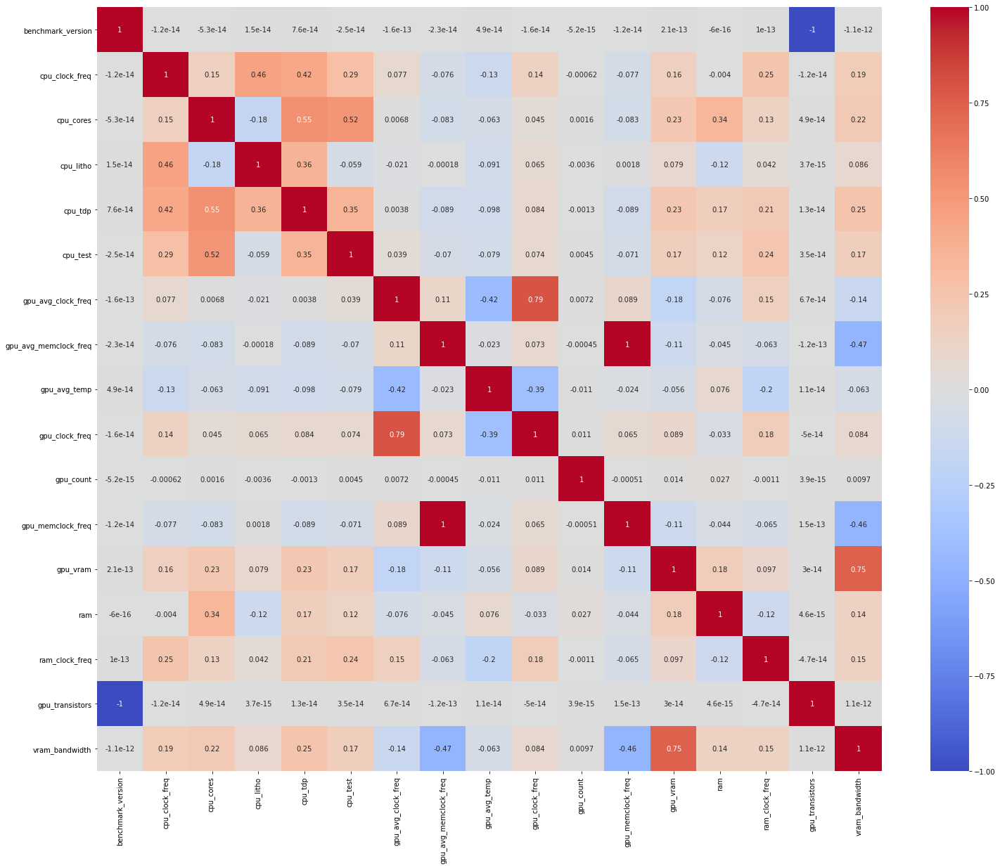

In [216]:
plt.figure(figsize=(25,20))
sns.heatmap(data.drop('score', axis=1).corr(), annot=True, cmap='coolwarm')
plt.show()

>*Dropping columns with correlation coefficient of over 0.8*

In [217]:
def remove_correlated_features(dataset, threshold):
    col_corr = set()
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (corr_matrix.iloc[i, j] >= threshold) and (corr_matrix.columns[j] not in col_corr):
                colname = corr_matrix.columns[i]
                col_corr.add(colname)
                if colname in dataset.columns:
                    print(f'Deleted {colname} from dataset.')
                    del dataset[colname]

    return dataset

In [218]:
data_ = data.copy()

In [219]:
remove_correlated_features(data_, 0.8)
data_['score'] = data['score']

Deleted gpu_memclock_freq from dataset.


>*Dropping more columns with negligible statistical contribution to the model*

In [220]:
data_.drop(['benchmark', 'benchmark_version', 'cpu_socket', 
            'gpu_avg_temp', 'gpu_driver_status', 'gpu_vendor', 
            'motherboard', 'os', 'storage', 'date', 'gpu_driver_version'], axis=1, inplace=True)

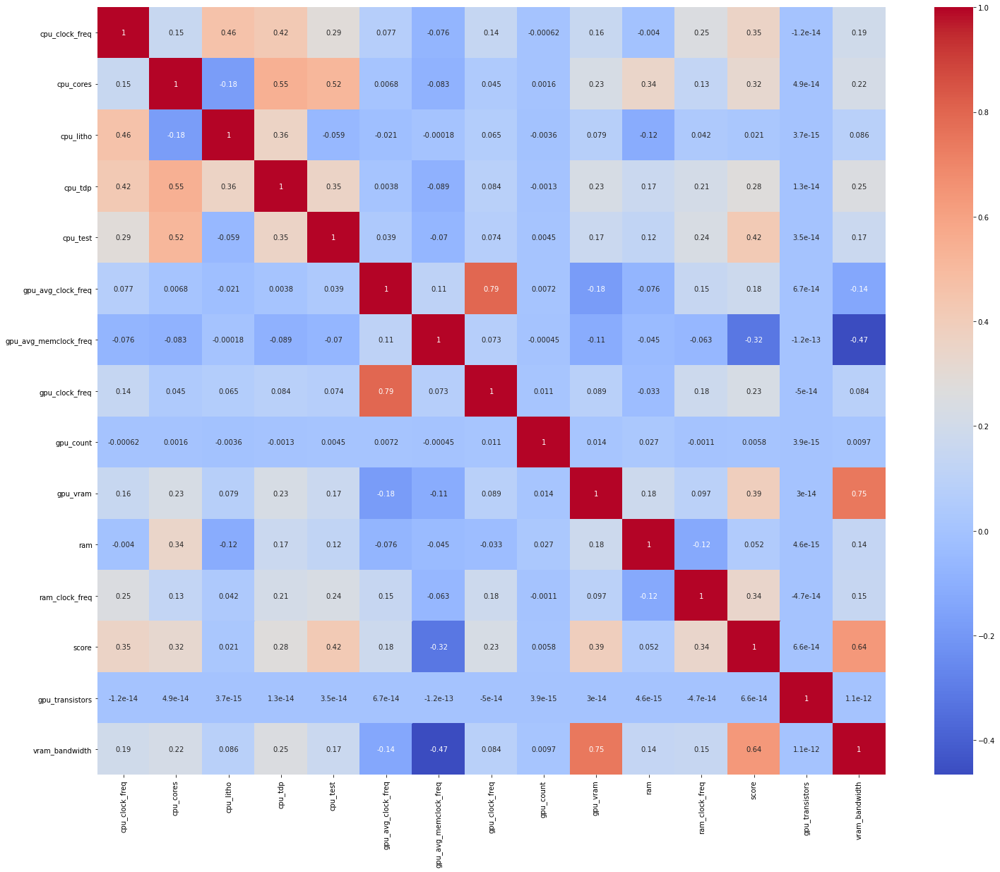

In [221]:
plt.figure(figsize=(25,20))
sns.heatmap(data_.corr(), annot=True, cmap='coolwarm')
plt.show()

## iii. Extended Data Analysis

*Before going ahead with the regression models, an insight over the data set is necessary to understand where things stand despite the limited scope.*

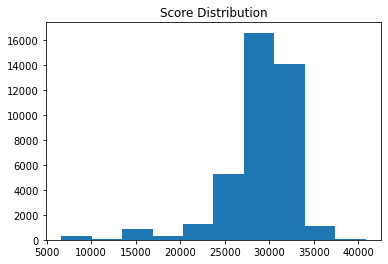

In [222]:
# score distribution
plt.hist(data_.score)
plt.title('Score Distribution')
plt.show()

*A long left tail is bound to provide a significant bump on the loss function, with the predictions having the most errors occuring at around 20000 and below. To explore further, the number of results that each GPU has may provide further insight as to why this is happening.*

In [223]:
print(f'Number of rows with score below 20000: {len(data_.loc[data_.score < 20000])}')
print(f'Number of rows with score above 20000: {len(data_.loc[data_.score > 20000])}')

Number of rows with score below 20000: 1525
Number of rows with score above 20000: 38415


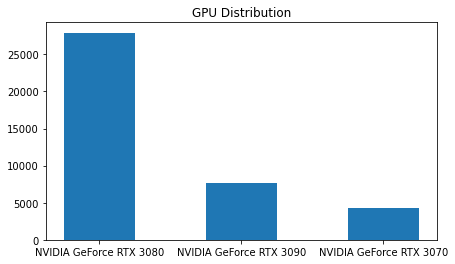

In [224]:
plt.figure(figsize=(7,4))
plt.bar(data_.gpu.value_counts().index, data_.gpu.value_counts()[0:], width=.5)
plt.title('GPU Distribution')
plt.show()

*Now that the cause is found, there is not much that can be done other than sampling since the data available in 3DMark is also limited.*

*Sample count would be the average between the RTX 3090 and RTX 3070 result counts to improve balance. I will now be demonstrating as to why this is a bad in the grand scheme of this research.*

In [225]:
# sampling to avoid class imbalance for the GPUs
count_3090 = len(data_.loc[data_['gpu'] == 'NVIDIA GeForce RTX 3090'])
count_3070 = len(data_.loc[data_['gpu'] == 'NVIDIA GeForce RTX 3070'])
ave = np.int((count_3090 + count_3070)/2)

rtx3080_sample = data_.loc[data_['gpu'] == 'NVIDIA GeForce RTX 3080'].sample(n=ave)
print(f'Sampled RTX 3080 results: {len(rtx3080_sample)}')

Sampled RTX 3080 results: 6011


In [226]:
# forming a new DataFrame with the sampled results
ndata_ = data_.loc[(data_.gpu == 'NVIDIA GeForce RTX 3090') | (data_.gpu == 'NVIDIA GeForce RTX 3070')]
testdata = pd.concat([ndata_, rtx3080_sample])
print(testdata.shape)
testdata.head()

(18034, 18)


,cpu_clock_freq,cpu_cores,cpu_litho,cpu_make,cpu_sku,cpu_tdp,cpu_test,gpu,gpu_avg_clock_freq,gpu_avg_memclock_freq,gpu_clock_freq,gpu_count,gpu_vram,ram,ram_clock_freq,score,gpu_transistors,vram_bandwidth
31697,5335,18,14,Intel,Core i9-9980XE Processor,165,126.22,NVIDIA GeForce RTX 3090,2241.0,1350.0,2265,1,24576,32768,3810.0,40808.0,28.3,935.8
31700,5348,18,14,Intel,Core i9-9980XE Processor,165,127.63,NVIDIA GeForce RTX 3090,2233.0,1350.0,2250,1,24576,32768,3808.0,40623.0,28.3,935.8
31701,5320,18,14,Intel,Core i9-9980XE Processor,165,128.15,NVIDIA GeForce RTX 3090,2240.0,1350.0,2250,1,24576,32768,3808.0,40526.0,28.3,935.8
31702,5270,18,14,Intel,Core i9-10980XE Extreme Edition Processor,165,124.85,NVIDIA GeForce RTX 3090,2176.0,1350.0,2250,1,24576,65536,4040.0,40438.0,28.3,935.8
31703,5319,18,14,Intel,Core i9-9980XE Processor,165,128.06,NVIDIA GeForce RTX 3090,2225.0,1350.0,2250,1,24576,32768,3808.0,40305.0,28.3,935.8


Base dataset size post-cleanup: 39941
Dataset size with sampled RTX 3080 results: 18034



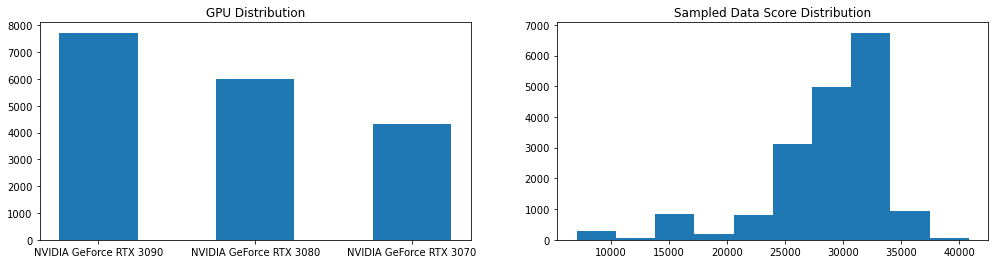

In [227]:
# size comparison between base data post-cleanup and data with sampled RTX 3080 results
print(f'Base dataset size post-cleanup: {len(data_)}\nDataset size with sampled RTX 3080 results: {len(finaldata)}\n')
plt.figure(figsize=(17,4))

plt.subplot(121)
plt.bar(testdata.gpu.value_counts().index, testdata.gpu.value_counts()[0:], width=.5)
plt.title('GPU Distribution')

plt.subplot(122)
plt.hist(testdata.score)
plt.title('Sampled Data Score Distribution')
plt.show()

*Effective count is down by almost 50% but 18034 results are still more than enough for the regression model, all variances accounted for.*

*Even so, the score distribution is still showing that drop below 20000. To prove that it is the results with the RTX 3070, I will be making a subset of the working DataFrame only with scores below 10000.*

GPU Distribution for scores < 10000:
NVIDIA GeForce RTX 3070    286
NVIDIA GeForce RTX 3080     14
Name: gpu, dtype: int64



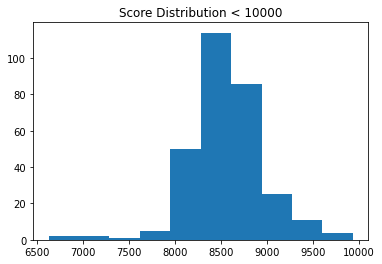

In [228]:
below_10000 = data_.loc[data_.score < 10000]
print(f'GPU Distribution for scores < 10000:\n{below_10000.gpu.value_counts()}\n')

plt.hist(below_10000.score)
plt.title('Score Distribution < 10000')
plt.show()

*While the distribution is somewhat normal visually, using this or cutting this off from the dataset will compromise the results and ultimately, the model.*

*At the moment, there is no clear solution to improve the number of results with scores under 20000. Nonetheless, I will be proceeding now with model selection and fine tuning it.*

## iv. Train-Test Split and Encoding

In [229]:
# encoder and scaler without any score or FPS data
to_encode = ['cpu_litho', 'cpu_make', 'cpu_sku', 'gpu']
to_scale = ['cpu_clock_freq', 'cpu_cores', 'cpu_litho', 
            'cpu_tdp', 'gpu_avg_clock_freq', 'gpu_avg_memclock_freq', 
            'gpu_clock_freq', 'gpu_count', 'gpu_vram', 'ram', 'ram_clock_freq',
            'gpu_transistors', 'vram_bandwidth']

scaler = StandardScaler()
ohe = OneHotEncoder(sparse=False)

*Scaling and Encoding the independent features*

In [230]:
# unprocessed_data is built for referencing for VIF later down the line in the analysis after getting the best scores possible
unprocessed_data = pd.concat([data_[to_scale], data_[to_encode]], axis=1)
unprocessed_data.head()

,cpu_clock_freq,cpu_cores,cpu_litho,cpu_tdp,gpu_avg_clock_freq,gpu_avg_memclock_freq,gpu_clock_freq,gpu_count,gpu_vram,ram,ram_clock_freq,gpu_transistors,vram_bandwidth,cpu_litho,cpu_make,cpu_sku,gpu
0,4475,12,7,105,1949.0,1188.0,1965,1,10240,16384,3200.0,28.3,760.0,7,AMD,Ryzen 9 3900X,NVIDIA GeForce RTX 3080
1,5002,8,14,125,1970.0,1188.0,2010,1,10240,32768,3198.0,28.3,760.0,14,Intel,Core i7-10700K Processor,NVIDIA GeForce RTX 3080
3,4509,16,7,105,2045.0,1250.0,2145,1,10240,32768,3740.0,28.3,760.0,7,AMD,Ryzen 9 3950X,NVIDIA GeForce RTX 3080
4,4501,16,7,105,2087.0,1338.0,2115,1,10240,32768,3798.0,28.3,760.0,7,AMD,Ryzen 9 3950X,NVIDIA GeForce RTX 3080
5,4724,16,7,105,2074.0,1297.0,2100,1,10240,32768,3732.0,28.3,760.0,7,AMD,Ryzen 9 3950X,NVIDIA GeForce RTX 3080


In [231]:
scaled_cols = scaler.fit_transform(data_[to_scale])
encoded_cols = ohe.fit_transform(data_[to_encode])
processed_data = np.concatenate([scaled_cols, encoded_cols], axis=1)

# Test size is set at 20%
X = processed_data
y = data_.score

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Modeling

In [232]:
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn import preprocessing

## i. Normalizing and Encoding

In [233]:
normalizer = preprocessing.Normalizer()

X_train = normalizer.fit_transform(X_train)
X_test = normalizer.transform(X_test)

## ii. Modeling: XGBoost v. Random Forest Regressor v. KNN Regressor

*I chose these regression algorithms mainly due to their efficacy and being at the top without having to go through the assumptions base algorithms need to have due to less inherent regularization.*

### XGBoost

In [234]:
xgb = XGBRegressor(verbosity=0)
xgb.fit(X_train, y_train)
xgb_trainpred = xgb.predict(X_train)
xgb_testpred = xgb.predict(X_test)

### Random Forest Regressor

In [235]:
rfr = RandomForestRegressor(max_features='sqrt', n_jobs=-1)
rfr.fit(X_train, y_train)
rfr_trainpred = rfr.predict(X_train)
rfr_testpred = rfr.predict(X_test)

### KNN Regressor

In [236]:
knn = KNeighborsRegressor(n_jobs=-1)
knn.fit(X_train, y_train)
knn_trainpred = knn.predict(X_train)
knn_testpred = knn.predict(X_test)

### Models' Score comparison

*For the scoring metrics, I chose to go with test accuracy, Mean CV score, and RMSE to see substantial differences - if there are any - between the models.*

XGB Train Score: 0.8816128840180363
XGB Test Score: 0.8205271262055294

RFR Train Score: 0.9756392617861209
RFR Test Score: 0.8428972526766425

KNN Train Score: 0.8475950001436765
KNN Test Score: 0.7710386819710477



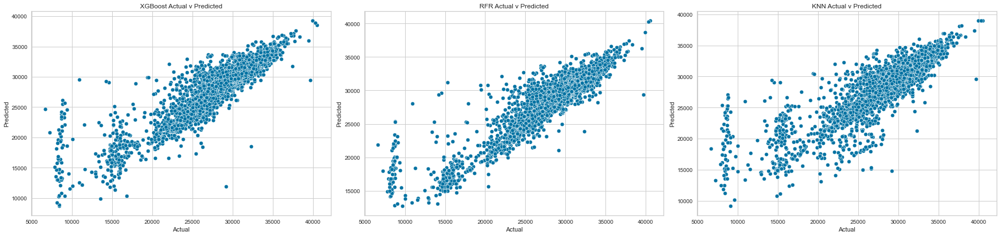


XGB Mean CV Score: 0.73
XGB RMSE: 1683.62

RFR Mean CV Score: 0.74
RFR RMSE: 1575.20

KNN Mean CV Score: 0.68
KNN RMSE: 1901.62


In [252]:
print(f'XGB Train Score: {xgb.score(X_train, y_train)}')
print(f'XGB Test Score: {xgb.score(X_test, y_test)}\n')
print(f'RFR Train Score: {rfr.score(X_train, y_train)}')
print(f'RFR Test Score: {rfr.score(X_test, y_test)}\n')
print(f'KNN Train Score: {knn.score(X_train, y_train)}')
print(f'KNN Test Score: {knn.score(X_test, y_test)}\n')

plt.figure(figsize=(25,6))
plt.subplot(1,3,1)
#sns.scatterplot(y_train, xgb_trainpred)
sns.scatterplot(y_test, xgb_testpred)
plt.title('XGBoost Actual v Predicted')
plt.ylabel('Predicted')
plt.xlabel('Actual')

plt.subplot(1,3,2)
#sns.scatterplot(y_train, rfr_trainpred)
sns.scatterplot(y_test, rfr_testpred)
plt.title('RFR Actual v Predicted')
plt.ylabel('Predicted')
plt.xlabel('Actual')

plt.subplot(1,3,3)
#sns.scatterplot(y_train, knn_trainpred)
sns.scatterplot(y_test, knn_testpred)
plt.title('KNN Actual v Predicted')
plt.ylabel('Predicted')
plt.xlabel('Actual')
plt.tight_layout()
plt.show()

xgb_scores = cross_val_score(xgb, X_test, y_test, cv=10)
print("\nXGB Mean CV Score: %.2f" % xgb_scores.mean())
xgb_mse = mean_squared_error(y_test, xgb_testpred)
print("XGB RMSE: %.2f" % np.sqrt(xgb_mse))

rfr_scores = cross_val_score(rfr, X_test, y_test, cv=10)
print("\nRFR Mean CV Score: %.2f" % rfr_scores.mean())
rfr_mse = mean_squared_error(y_test, rfr_testpred)
print("RFR RMSE: %.2f" % np.sqrt(rfr_mse))

knn_scores = cross_val_score(knn, X_test, y_test, cv=10)
print("\nKNN Mean CV Score: %.2f" % knn_scores.mean())
knn_mse = mean_squared_error(y_test, knn_testpred)
print("KNN RMSE: %.2f" % np.sqrt(knn_mse))

>*Upon checking, the XGBoost model seems to be the most reliable and second-most accurate model without exhibiting overfitting.*
*The Random Forest Regressor may seem better at first but its train and test scores say otherwise. Low bias and high variance is a tell of overfitting even with scaled and normalized feature set. With tuning, it is possible to get better scores than what the base Random Forest Regressor model exhibited.*

## iii. Model Selection: XGBoost Hyperparameter Tuning

In [26]:
params = {'learning_rate': [0.1, 0.25, 0.5], 
          'booster': ['gbtree','gblinear','dart'],
          'n_estimators': [100, 150, 200], 
          'max_depth': [4,5]}

gsr = GridSearchCV(XGBRegressor(), param_grid=params, cv=10, n_jobs=-1, verbose=1)
gsr.fit(X_train, y_train)

Fitting 10 folds for each of 54 candidates, totalling 540 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:   48.8s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 418 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 540 out of 540 | elapsed: 16.1min finished


GridSearchCV(cv=10,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, gamma=None,
                                    gpu_id=None, importance_type='gain',
                                    interaction_constraints=None,
                                    learning_rate=None, max_delta_step=None,
                                    max_depth=None, min_child_weight=None,
                                    missing=nan, monotone_constraints=None,
                                    n_estimators=100, n_jobs=None,
                                    num_parallel_tree=None, random_state=None,
                                    reg_alpha=None, reg_lambda=None,
                                    scale_pos_weight=None, subsample=None,
                                    tree_method=None, validate_par

In [30]:
print(f'XGB Best Score: {gsr.best_score_}')
gsr.best_estimator_

XGB Best Score: 0.8087864574861025


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.5, max_delta_step=0, max_depth=5,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=200, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [238]:
nxgb = XGBRegressor(base_score=0.5, booster='dart', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.5, max_delta_step=0, max_depth=4,
             min_child_weight=1, missing=np.nan, monotone_constraints='()',
             n_estimators=200, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=1)

nxgb.fit(X_train, y_train)
nxgb_trainpred = nxgb.predict(X_train)
nxgb_testpred = nxgb.predict(X_test)

XGB Train Score: 0.8816128840180363
XGB Test Score: 0.8205271262055294

Tuned XGB Train Score: 0.893045862145743
Tuned XGB Test Score: 0.8206744383704037



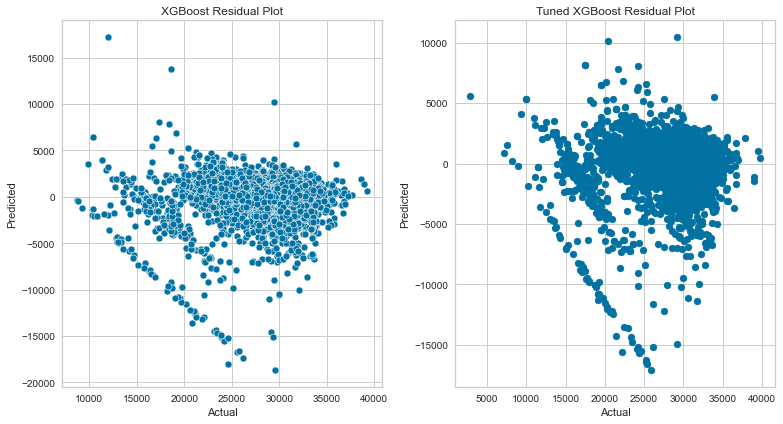


XGB Mean CV Score: 0.73
Tuned XGB Mean CV Score: 0.71
XGB RMSE: 1683.62
Tuned XGB RMSE: 1682.92


In [254]:
print(f'XGB Train Score: {xgb.score(X_train, y_train)}')
print(f'XGB Test Score: {xgb.score(X_test, y_test)}\n')
print(f'Tuned XGB Train Score: {nxgb.score(X_train, y_train)}')
print(f'Tuned XGB Test Score: {nxgb.score(X_test, y_test)}\n')

plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.scatterplot(xgb_testpred, (y_test - xgb_testpred))
plt.title('XGBoost Residual Plot')
plt.ylabel('Predicted')
plt.xlabel('Actual')

plt.subplot(1,2,2)
plt.scatter(nxgb_testpred, (y_test - nxgb_testpred))
plt.title('Tuned XGBoost Residual Plot')
plt.ylabel('Predicted')
plt.xlabel('Actual')

plt.tight_layout()
plt.show()

nxgb_scores = cross_val_score(nxgb, X_test, y_test, cv=10)
print("\nXGB Mean CV Score: %.2f" % xgb_scores.mean())
print("Tuned XGB Mean CV Score: %.2f" % nxgb_scores.mean())
nxgb_mse = mean_squared_error(y_test, nxgb_testpred)
print("XGB RMSE: %.2f" % np.sqrt(xgb_mse))
print("Tuned XGB RMSE: %.2f" % np.sqrt(nxgb_mse))

>*By referencing the GridSearchCV results, it seems that an extra effort on tuning may pay off dividends. I would be setting the floor on the params that were considered best.*

In [240]:
params_1 = {'learning_rate': [0.5], 
          'booster': ['dart'],
          'n_estimators': [200], 
          'max_depth': [5],
          'n_jobs': [-1],
          'tree_method': ['hist'],
          'gamma': [6],
          'lambda': [12],
          'alpha': [1],
          'min_child_weight': [10],
          'subsample': [.8]}

fit_params={'early_stopping_rounds': 40,
            'eval_metric': 'mae',
            'eval_set': [[X_test, y_test]]}

ngsr = GridSearchCV(XGBRegressor(), param_grid=params_1, cv=10, n_jobs=10)
ngsr.fit(X_train, y_train, **fit_params)

n_0-mae:1075.18640
[50]	validation_0-mae:1070.89661
[51]	validation_0-mae:1068.70496
[52]	validation_0-mae:1069.02625
[53]	validation_0-mae:1065.44495
[54]	validation_0-mae:1066.29468
[55]	validation_0-mae:1065.59424
[56]	validation_0-mae:1063.76196
[57]	validation_0-mae:1062.48254
[58]	validation_0-mae:1062.09326
[59]	validation_0-mae:1058.37048
[60]	validation_0-mae:1057.18213
[61]	validation_0-mae:1055.11743
[62]	validation_0-mae:1053.41650
[63]	validation_0-mae:1052.49524
[64]	validation_0-mae:1050.41882
[65]	validation_0-mae:1050.30591
[66]	validation_0-mae:1049.53577
[67]	validation_0-mae:1051.71130
[68]	validation_0-mae:1050.45312
[69]	validation_0-mae:1048.90063
[70]	validation_0-mae:1046.61194
[71]	validation_0-mae:1044.44238
[72]	validation_0-mae:1044.16370
[73]	validation_0-mae:1042.93982
[74]	validation_0-mae:1041.57861
[75]	validation_0-mae:1040.03491
[76]	validation_0-mae:1037.83789
[77]	validation_0-mae:1036.51807
[78]	validation_0-mae:1033.56458
[79]	validation_0-mae:10

GridSearchCV(cv=10,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, gamma=None,
                                    gpu_id=None, importance_type='gain',
                                    interaction_constraints=None,
                                    learning_rate=None, max_delta_step=None,
                                    max_depth=None, min_child_weight=None,
                                    missing=nan, monotone_constraints=None,
                                    n_estimators=100, n_jobs...
                                    num_parallel_tree=None, random_state=None,
                                    reg_alpha=None, reg_lambda=None,
                                    scale_pos_weight=None, subsample=None,
                                    tree_method=None, validate_parame

In [241]:
ngsr_pred = ngsr.predict(X_test)
predictions = [round(value) for value in ngsr_pred]
print(f'Tuned XGB Best Score: {ngsr.best_score_}')
print(f'Train score: {ngsr.score(X_train, y_train)}')
print(f'Test score: {ngsr.score(X_test, y_test)}')

ngsr.best_estimator_

Tuned XGB Best Score: 0.8106694425158146
Train score: 0.9013244779622795
Test score: 0.8221178110811105


XGBRegressor(alpha=1, base_score=0.5, booster='dart', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=6, gpu_id=-1,
             importance_type='gain', interaction_constraints='', lambda=12,
             learning_rate=0.5, max_delta_step=0, max_depth=5,
             min_child_weight=10, missing=nan, monotone_constraints='()',
             n_estimators=200, n_jobs=-1, num_parallel_tree=1, random_state=0,
             reg_alpha=1, reg_lambda=12, scale_pos_weight=1, subsample=0.8,
             tree_method='hist', validate_parameters=1, verbosity=None)

>*After numerous runs, the best parameters seem to be the following:*
>* booster = dart
>* learning_rate = 0.5
>* gamma = 6
>* lambda = 12
>* alpha = 1
>* min_child_weight=10
>* max_depth = 5
>* n_estimators = 200
>* subsample = 0.8

## iv. Best Model (so far)

In [242]:
best = XGBRegressor(alpha=1, base_score=0.5, booster='dart', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=6, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.5, max_delta_step=0, max_depth=5,
             min_child_weight=10, missing=np.nan, monotone_constraints='()',
             n_estimators=200, n_jobs=-1, num_parallel_tree=1, random_state=0,
             reg_alpha=1, reg_lambda=12, scale_pos_weight=1, subsample=0.8,
             tree_method='hist', validate_parameters=1, verbosity=None)
best.fit(X_train, y_train)

XGBRegressor(alpha=1, base_score=0.5, booster='dart', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=6, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.5, max_delta_step=0, max_depth=5,
             min_child_weight=10, missing=nan, monotone_constraints='()',
             n_estimators=200, n_jobs=-1, num_parallel_tree=1, random_state=0,
             reg_alpha=1, reg_lambda=12, scale_pos_weight=1, subsample=0.8,
             tree_method='hist', validate_parameters=1, verbosity=None)

### Checking $r^2$ scores

In [246]:
r2_scores = cross_val_score(best, X_test, y_test, scoring='r2')

In [247]:
print(r2_scores)

[0.6901177  0.6971333  0.7161747  0.72116997 0.72621018]


*On 5 folds, we are not seeing any overfitting, defining that the best-tuned XGBoost model above is beyond good and will provide better $r^2$ scores once more results for the RTX 3070 becomes available.*

Best Tuned XGB Train score: 0.9019870262542844
Best Tuned XGB Test score: 0.8217346921016413
Best Tuned XGB RMSE: 1677.94


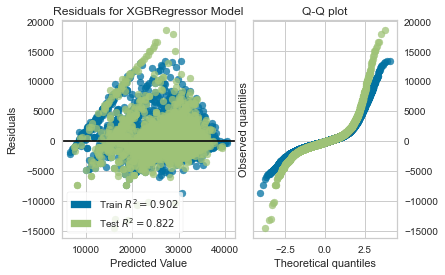

<AxesSubplot:title={'center':'Residuals for XGBRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [261]:
best_pred = best.predict(X_test)
best_res = y_test - best_pred
best_preds = [round(value) for value in best_pred]
print(f'Best Tuned XGB Train score: {best.score(X_train, y_train)}')
print(f'Best Tuned XGB Test score: {best.score(X_test, y_test)}')
best_mse = mean_squared_error(y_test, best_pred)
print("Best Tuned XGB RMSE: %.2f" % np.sqrt(best_mse))

vis = ResidualsPlot(best, hist=False, qqplot=True)
vis.fit(X_train, y_train)
vis.score(X_test, y_test)
vis.show()

*With the model above, I have found the best possible hyperparameters for the XGBoost Regressor despite the non-normal distribution of the target variable, 'scores'.*

*That said, it still is not the best possible model for what I intend to use it for. The errors at the low end are caused by the lack of score values ranging from 10000 to 20000. By plurality, 20000 and beyond were tight with low variance. The qq plot amplifies this fact by falling off around on 0 observed quantities. To prove this, check the cell below.*

In [37]:
print(f'Number of rows with score below 20000: {len(data_.loc[data_.score < 20000])}')
print(f'Number of rows with score above 20000: {len(data_.loc[data_.score > 20000])}')

Number of rows with score below 20000: 1525
Number of rows with score above 20000: 38415


*Currently, there is no mitigation to improve the model further since the scores at the low end are from results with the RTX 3070 as the GPU. It is considerably new on the market, hence the lack of results compared to the RTX 3080 and 3090.*

In [38]:
data.gpu.value_counts()

NVIDIA GeForce RTX 3080    27918
NVIDIA GeForce RTX 3090     7722
NVIDIA GeForce RTX 3070     4301
Name: gpu, dtype: int64

*There will be improvements implemented later on to the model as more data becomes available from 3DMark.*

# Summary

## i. Initial

# Summary

*Compared to how overfitting usually presents itself on models with less features, the $r^2$ scores were more than acceptable to debunk an initial speculation that it may be overfitting despite the linear relationship shown in the residual plot.*

*I am currently not able to go further and do more exploration, especially with regards to feature importance beyond my understanding of computer hardware, but since I will not be having electricity for the good part of the day of presentation (Friday), I am forced to go over this and update this notebook over the weekend and port it over to GitHub for readability with a progress tracker.*

## ii. Identified Pain Points

*As explain before modeling and at the summary for the best-tuned model, the model falls off on the low end at around 20000 and below caused by lack of data covering that score spectrum. Other than that, a detailed analysis of the results that presents the impact of each component and its metrics is bound to be done over the weekend.*

>* Lack of results that has scores < 20000
>* Feature explanation post-modeling

## iii. Future addition

*After getting more data beyond the RTX 3000 GPUs, I will be making an iOS mobile app first that would enable users to have a range of scores given a specific set of computer parts (CPU, GPU, RAM) with their individual clock speeds.*